<a href="https://colab.research.google.com/github/edwin-isa/PCVK/blob/Jobsheet-5/Week5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# KELOMPOK 8
Week 5

Nama Anggota Kelompok

1. Mirabell Joice Laura (2141720174)
2. **M. Edwin Isa Alfais (2141720193)**
3. Nabilah Amaalina Syafa (2141720198)


# MODUL 5 – Operasi Aritmatika dan Logika - Gamma Correction, Image Depth, PSNR, Average Denoising, Image Masking**

## Tugas Praktikum

### 1. Buat Gamma Correction sesuai dengan petunjuk berikut:
Percobaan ini akan meminta anda membuat Gamma Correction. Pada percobaan ini, nilai Gamma akan diset dengan meminta masukan dari pengguna. Berikut adalah kode untuk meminta masukan nilai dari pengguna. Lanjutkan kode tersebut dengan membuat image dengan gamma correction sesuai rumus yang telah diberikan.

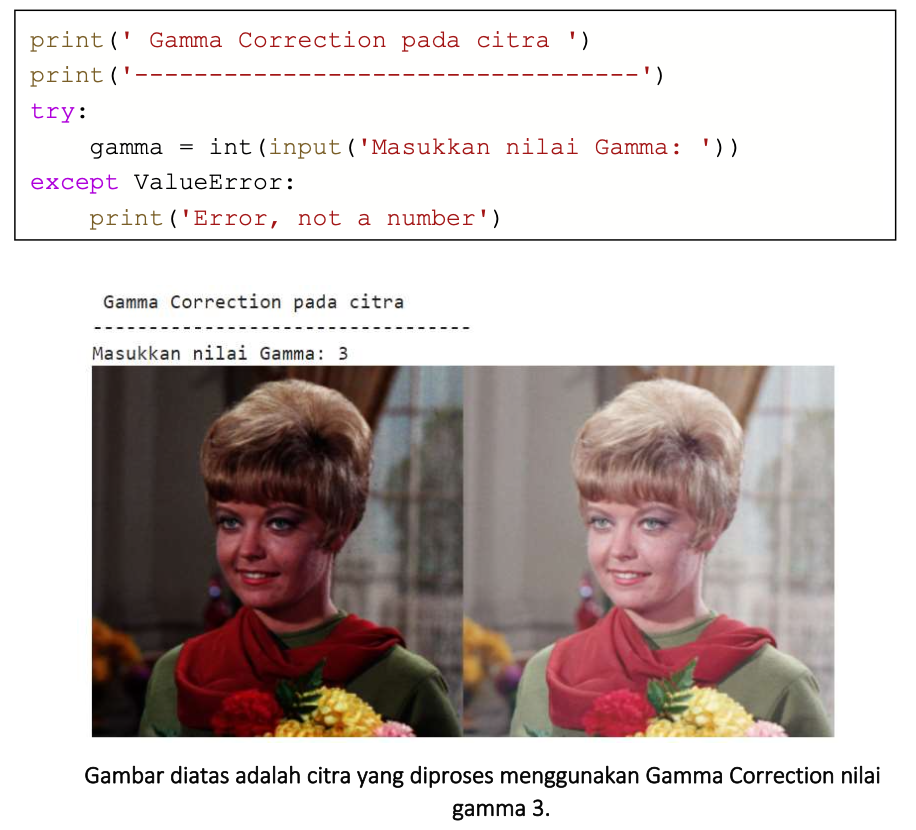

In [1]:
from google.colab import drive

# Accessing My Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Import Library
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
import sys
import glob

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


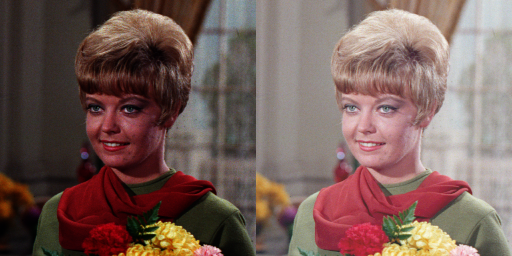

In [3]:
# Tugas 1
# Gamma Correction

print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
  gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/College/Semester 5/PCVK/Pertemuan 3/female.tiff')
gamma_image = np.zeros(original.shape, original.dtype)

# Fungsi untuk menghitung gamma correction dengan memasukkan parameter source image dan nilai gamma yang tela diinput
def gammaCorrection(src, gamma):
    invGamma = 1 / gamma

    table = [((i / 255) ** invGamma) * 255 for i in range(256)]
    table = np.array(table, np.uint8)

    return cv.LUT(src, table)

gamma_image = gammaCorrection(original, gamma)
final_frame = cv.hconcat((original, gamma_image))
cv2_imshow(final_frame)

### 2. Buat Simulasi Image Depth
Percobaan ini digunakan sebagai simulasi dari proses kuantisasi citra. Pada kuantisasi citra, pixel dapat direpresentasikan dengan n-bit kedalaman (default menggunakan 8-bit). Pada pixel 8-bit, warna yang memungkinkan adalah 256 warna, dari 0 (0000 0000) hingga 255(1111 1111). Pada pixel 7-bit, warna yang memungkinkan adalah 128 warna, dari 0 (000 0000) hingga 127 (111 1111). Kemungkinan warna didapat dari pangkat 2 jumlah bit. Jika 7bit, maka jumlah warnanya adalah 27 = 128, dst. Berikut adalah kode untuk membaca citra masukan dan memberi nilai kedalaman citra, silahkan lanjutkan kode program berikut sehingga menghasilkan keluaran seperti contoh pada Gambar.

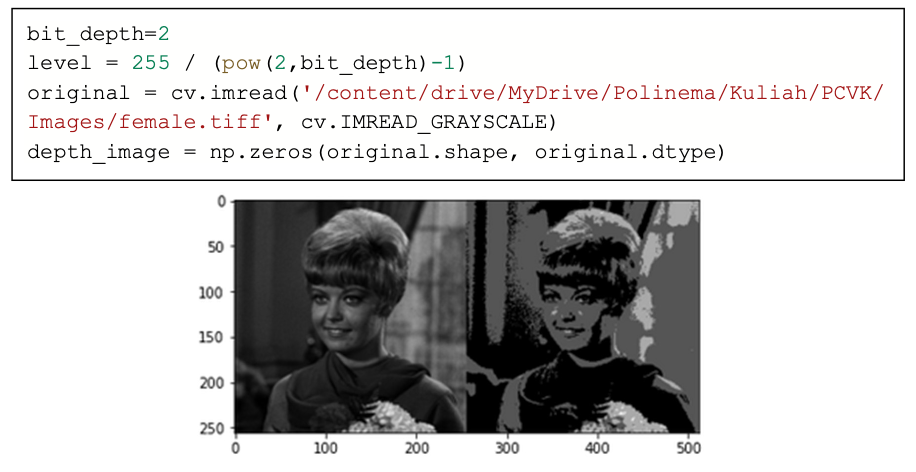

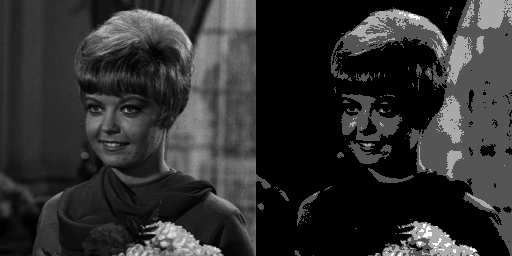

In [27]:
# Tugas 2
# Simulasi Image Depth

import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np

# Tentukan kedalaman bit (misalnya, 2-bit)
bit_depth = 2
levels = 2**bit_depth

# Baca citra masukan
original = cv.imread('/content/drive/MyDrive/College/Semester 5/PCVK/Pertemuan 3/female.tiff', cv.IMREAD_GRAYSCALE)

# Inisialisasi citra kedalaman
depth_image = np.zeros(original.shape, dtype=np.uint8)

# Hitung faktor skalasi untuk konversi nilai citra
scale_factor = 255 / (levels - 1)

# Proses kuantisasi citra
for i in range(levels):
    lower_limit = (i * 256) // levels
    upper_limit = ((i + 1) * 256) // levels
    mask = np.logical_and(original >= lower_limit, original < upper_limit)
    depth_image[mask] = i * scale_factor

# Tampilkan hasil gambar
result_image = cv.hconcat([original, depth_image])
cv2_imshow(result_image)

cv.waitKey(0)
cv.destroyAllWindows()


### 3. Buat modul Average Denoising
Buat modul average denoising sesuai dengan rumus yang telah diberikan pada sub bab sebelumnya.
Citra asli sudah disediakan pada /images/galaxy.jpg.
100 Citra dengan Gaussian Noise sudah disediakan pada /images/noises/*.jpg
Anda dapat menggunakan code berikut untuk membaca semua image dalam satu folder , gunakan modul glob (import glob).

cv_img = []
for img in glob.glob('/content/drive/MyDrive/Polinema/Kuliah/PCVK/ Images/noises/*.jpg'):
    n= cv.imread(img)
    cv_img.append(n)

Dengan menggunakan code diatas, anda tinggal memanggil image difolder tersebut menggunakan cv_img[0], cv_img[1], dst.

In [32]:
# Tugas 3
# Average Denoising

# Import Library
import glob
from math import sqrt, log10

# Read Image
original = cv.imread('/content/drive/MyDrive/College/Semester 5/PCVK/Pertemuan 5/galaxy.jpg')

# Memasukkan Image ke Array
cv_img = []
for img in glob.glob('/content/drive/MyDrive/College/Semester 5/PCVK/Pertemuan 5/noises/*.jpg'):
 n = cv.imread(img)
 cv_img.append(n)

Citra Avarage 5

Jumlah Citra = 5
Nilai PSNR = 27.5353499403316 dB


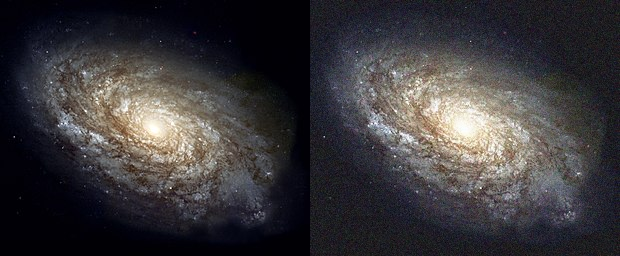

In [33]:
# Jumlah Citra
jml_citra = 5

# Mengambil citra ke-5 (indeks ke-4) dari list cv_img
noise_image = cv_img[jml_citra - 1]

# Loop melalui citra-citra yang akan di-average
for i in range(jml_citra):
    # Hitung bobot alpha untuk citra ke-i
    alpha = 1.0 / (i + 1)

    # Hitung bobot beta untuk citra ke-i
    beta = 1.0 - alpha

    # Menggunakan cv.addWeighted untuk menghitung citra hasil denoising
    noise_image = cv.addWeighted(cv_img[i], alpha, noise_image, beta, 0.0)

# img1 = original image
# img2 = denoise image yang sudah dirata-ratakan

# Fungsi untuk menghitung nilai PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        # Mengatasi kasus jika MSE adalah 0 (tidak ada noise)
        # PSNR tidak memiliki arti jika MSE adalah 0
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Hitung nilai PSNR antara citra asli dan citra hasil denoising
psnr = PSNR(original, noise_image)

# Cetak hasil PSNR
print('Jumlah Citra =', jml_citra)
print('Nilai PSNR =', psnr, 'dB')

# Menampilkan citra asli dan citra hasil denoising dalam satu jendela grafik
final_frame = cv.hconcat((original, noise_image))
cv2_imshow(final_frame)

Citra Avarage 10

Jumlah Citra = 10
Nilai PSNR = 27.556181403921475 dB


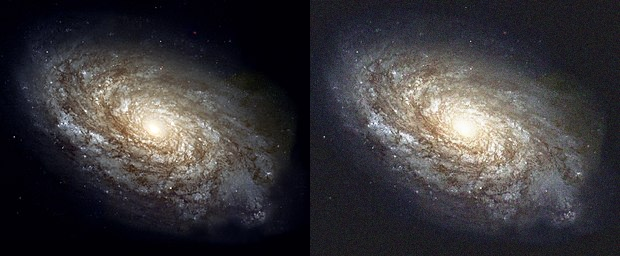

In [34]:
# Jumlah Citra
jml_citra = 10

# Mengambil citra ke-5 (indeks ke-4) dari list cv_img
noise_image = cv_img[jml_citra - 1]

# Loop melalui citra-citra yang akan di-average
for i in range(jml_citra):
    # Hitung bobot alpha untuk citra ke-i
    alpha = 1.0 / (i + 1)

    # Hitung bobot beta untuk citra ke-i
    beta = 1.0 - alpha

    # Menggunakan cv.addWeighted untuk menghitung citra hasil denoising
    noise_image = cv.addWeighted(cv_img[i], alpha, noise_image, beta, 0.0)

# img1 = original image
# img2 = denoise image yang sudah dirata-ratakan

# Fungsi untuk menghitung nilai PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        # Mengatasi kasus jika MSE adalah 0 (tidak ada noise)
        # PSNR tidak memiliki arti jika MSE adalah 0
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Hitung nilai PSNR antara citra asli dan citra hasil denoising
psnr = PSNR(original, noise_image)

# Cetak hasil PSNR
print('Jumlah Citra =', jml_citra)
print('Nilai PSNR =', psnr, 'dB')

# Menampilkan citra asli dan citra hasil denoising dalam satu jendela grafik
final_frame = cv.hconcat((original, noise_image))
cv2_imshow(final_frame)

Citra Avarage 20

Jumlah Citra = 20
Nilai PSNR = 27.549527454197534 dB


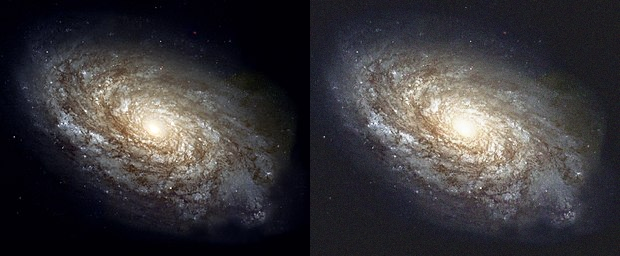

In [35]:
# Jumlah Citra
jml_citra = 20

# Mengambil citra ke-5 (indeks ke-4) dari list cv_img
noise_image = cv_img[jml_citra - 1]

# Loop melalui citra-citra yang akan di-average
for i in range(jml_citra):
    # Hitung bobot alpha untuk citra ke-i
    alpha = 1.0 / (i + 1)

    # Hitung bobot beta untuk citra ke-i
    beta = 1.0 - alpha

    # Menggunakan cv.addWeighted untuk menghitung citra hasil denoising
    noise_image = cv.addWeighted(cv_img[i], alpha, noise_image, beta, 0.0)

# img1 = original image
# img2 = denoise image yang sudah dirata-ratakan

# Fungsi untuk menghitung nilai PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        # Mengatasi kasus jika MSE adalah 0 (tidak ada noise)
        # PSNR tidak memiliki arti jika MSE adalah 0
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Hitung nilai PSNR antara citra asli dan citra hasil denoising
psnr = PSNR(original, noise_image)

# Cetak hasil PSNR
print('Jumlah Citra =', jml_citra)
print('Nilai PSNR =', psnr, 'dB')

# Menampilkan citra asli dan citra hasil denoising dalam satu jendela grafik
final_frame = cv.hconcat((original, noise_image))
cv2_imshow(final_frame)

Citra Avarage 40

Jumlah Citra = 40
Nilai PSNR = 27.503593368021818 dB


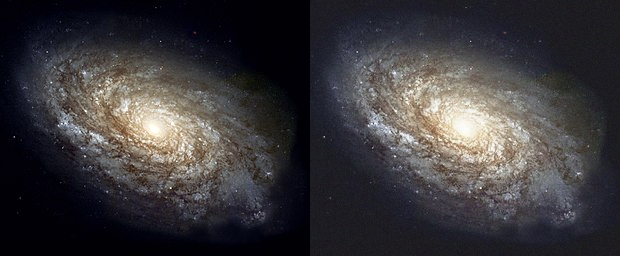

In [36]:
# Jumlah Citra
jml_citra = 40

# Mengambil citra ke-5 (indeks ke-4) dari list cv_img
noise_image = cv_img[jml_citra - 1]

# Loop melalui citra-citra yang akan di-average
for i in range(jml_citra):
    # Hitung bobot alpha untuk citra ke-i
    alpha = 1.0 / (i + 1)

    # Hitung bobot beta untuk citra ke-i
    beta = 1.0 - alpha

    # Menggunakan cv.addWeighted untuk menghitung citra hasil denoising
    noise_image = cv.addWeighted(cv_img[i], alpha, noise_image, beta, 0.0)

# img1 = original image
# img2 = denoise image yang sudah dirata-ratakan

# Fungsi untuk menghitung nilai PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        # Mengatasi kasus jika MSE adalah 0 (tidak ada noise)
        # PSNR tidak memiliki arti jika MSE adalah 0
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Hitung nilai PSNR antara citra asli dan citra hasil denoising
psnr = PSNR(original, noise_image)

# Cetak hasil PSNR
print('Jumlah Citra =', jml_citra)
print('Nilai PSNR =', psnr, 'dB')

# Menampilkan citra asli dan citra hasil denoising dalam satu jendela grafik
final_frame = cv.hconcat((original, noise_image))
cv2_imshow(final_frame)

Citra Avarage 80

Jumlah Citra = 80
Nilai PSNR = 27.508532444338893 dB


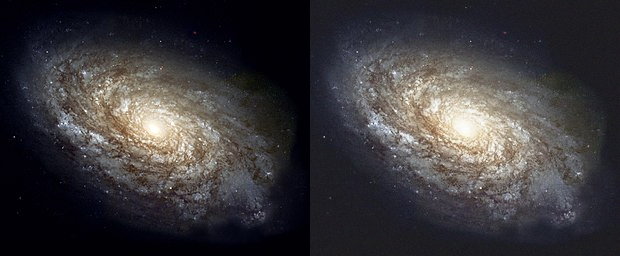

In [37]:
# Jumlah Citra
jml_citra = 80

# Mengambil citra ke-5 (indeks ke-4) dari list cv_img
noise_image = cv_img[jml_citra - 1]

# Loop melalui citra-citra yang akan di-average
for i in range(jml_citra):
    # Hitung bobot alpha untuk citra ke-i
    alpha = 1.0 / (i + 1)

    # Hitung bobot beta untuk citra ke-i
    beta = 1.0 - alpha

    # Menggunakan cv.addWeighted untuk menghitung citra hasil denoising
    noise_image = cv.addWeighted(cv_img[i], alpha, noise_image, beta, 0.0)

# img1 = original image
# img2 = denoise image yang sudah dirata-ratakan

# Fungsi untuk menghitung nilai PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        # Mengatasi kasus jika MSE adalah 0 (tidak ada noise)
        # PSNR tidak memiliki arti jika MSE adalah 0
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Hitung nilai PSNR antara citra asli dan citra hasil denoising
psnr = PSNR(original, noise_image)

# Cetak hasil PSNR
print('Jumlah Citra =', jml_citra)
print('Nilai PSNR =', psnr, 'dB')

# Menampilkan citra asli dan citra hasil denoising dalam satu jendela grafik
final_frame = cv.hconcat((original, noise_image))
cv2_imshow(final_frame)

Citra Avarage 100

Jumlah Citra = 100
Nilai PSNR = 27.508892213991718 dB


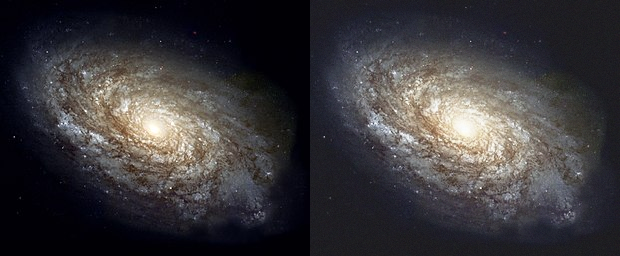

In [38]:
# Jumlah Citra
jml_citra = 100

# Mengambil citra ke-5 (indeks ke-4) dari list cv_img
noise_image = cv_img[jml_citra - 1]

# Loop melalui citra-citra yang akan di-average
for i in range(jml_citra):
    # Hitung bobot alpha untuk citra ke-i
    alpha = 1.0 / (i + 1)

    # Hitung bobot beta untuk citra ke-i
    beta = 1.0 - alpha

    # Menggunakan cv.addWeighted untuk menghitung citra hasil denoising
    noise_image = cv.addWeighted(cv_img[i], alpha, noise_image, beta, 0.0)

# img1 = original image
# img2 = denoise image yang sudah dirata-ratakan

# Fungsi untuk menghitung nilai PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        # Mengatasi kasus jika MSE adalah 0 (tidak ada noise)
        # PSNR tidak memiliki arti jika MSE adalah 0
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Hitung nilai PSNR antara citra asli dan citra hasil denoising
psnr = PSNR(original, noise_image)

# Cetak hasil PSNR
print('Jumlah Citra =', jml_citra)
print('Nilai PSNR =', psnr, 'dB')

# Menampilkan citra asli dan citra hasil denoising dalam satu jendela grafik
final_frame = cv.hconcat((original, noise_image))
cv2_imshow(final_frame)

Kesimpulannya adalah dengan menggunakan proses average denoising dengan jumlah citra yang lebih banyak dapat meningkatkan kualitas gambar dan mengurangi noise dalam citra asli. Namun, dalam pemilihan metode denoising dan jumlah citra yang digunakan akan tergantung pada tingkat noise dan karakteristik citra yang ada.

### 4. Buat image masking untuk image berikut.
Image kiri adalah image asli (image KTP), sedangkan image paling kanan adalah hasilnya:

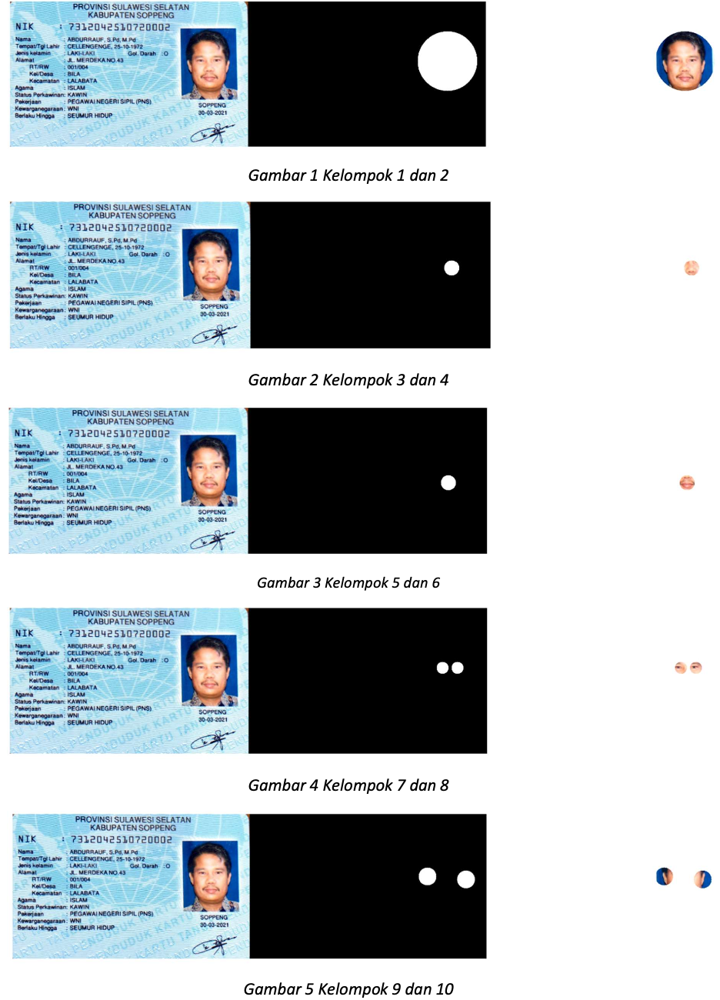

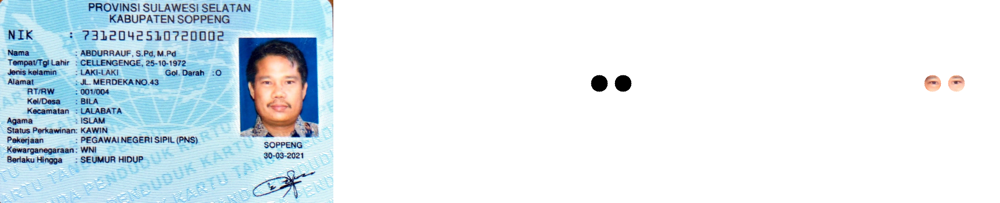

In [68]:
# Membaca gambar asli
original = cv.imread('/content/drive/MyDrive/College/Semester 5/PCVK/Pertemuan 1/KTP.jpeg')

# Membuat gambar kosong dengan latar belakang putih
gambar_kosong = np.ones(original.shape, dtype=np.uint8) * 255

# Gambar lingkaran pertama pada gambar_kosong
cv.circle(gambar_kosong, (695, 200), 20, (0, 0, 0), -1)

# Gambar lingkaran kedua pada gambar_kosong
cv.circle(gambar_kosong, (638, 200), 20, (0, 0, 0), -1)

# Menggabungkan citra asli dengan gambar_kosong menggunakan bitwise OR
combine = cv.bitwise_or(original, gambar_kosong)

# Menampilkan gambar asli dan hasilnya
result = cv.hconcat((original, gambar_kosong, combine))
cv2_imshow(result)


### 5. Lakukan percobaan menggunakan operator lain dan tunjukkan hasilnya pada modul ini. Tuliskan hasil analisa anda kenapa citra keluarannya seperti itu.

NOT (KOMPLEMEN)

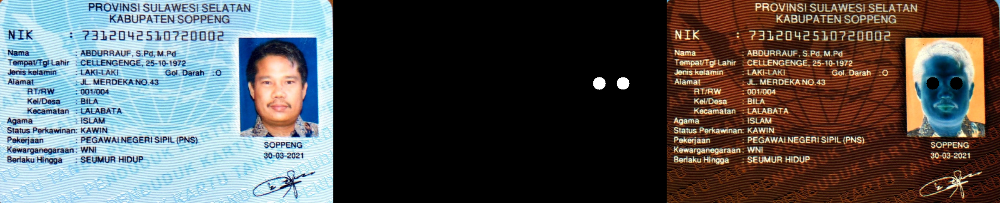

In [69]:

# Membaca gambar asli
original = cv.imread('/content/drive/MyDrive/College/Semester 5/PCVK/Pertemuan 1/KTP.jpeg')

# Membuat gambar mask dengan dua lingkaran berwarna putih (255, 255, 255)
mask = np.zeros(original.shape, dtype=np.uint8)
mask = cv.circle(mask, (695, 200), 15, (255, 255, 255), -1)
mask = cv.circle(mask, (638, 200), 15, (255, 255, 255), -1)

# Melakukan operasi NOT
masked = ~original & ~mask

# Menggabungkan hasil citra asli, mask dan hasil operasi NOT
final_frame = cv.hconcat((original, mask, masked))

# Menampilkan hasil
cv2_imshow(final_frame)

OR (ATAU)

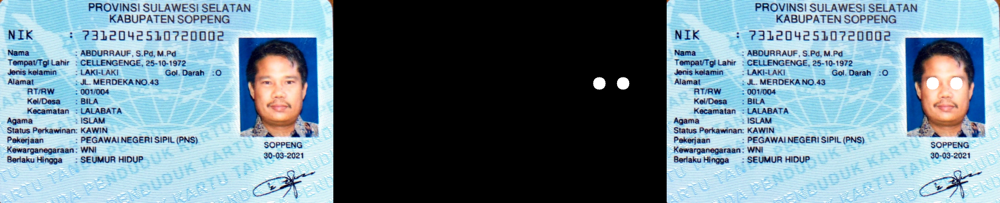

In [71]:
# Membaca gambar asli
original = cv.imread('/content/drive/MyDrive/College/Semester 5/PCVK/Pertemuan 1/KTP.jpeg')

# Membuat gambar mask dengan dua lingkaran berwarna putih (255, 255, 255)
mask = np.zeros(original.shape, dtype=np.uint8)
mask = cv.circle(mask, (695, 200), 15, (255, 255, 255), -1)
mask = cv.circle(mask, (638, 200), 15, (255, 255, 255), -1)

# Melakukan operasi OR
masked = original | mask

# Menggabungkan hasil citra asli, mask dan hasil operasi OR
final_frame = cv.hconcat((original, mask, masked))

# Menampilkan hasil
cv2_imshow(final_frame)

AND (DAN)

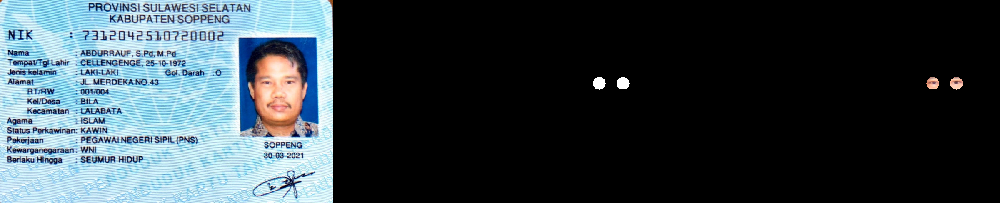

In [73]:
# Membaca gambar asli
original = cv.imread('/content/drive/MyDrive/College/Semester 5/PCVK/Pertemuan 1/KTP.jpeg')

# Membuat gambar mask dengan dua lingkaran berwarna putih (255, 255, 255)
mask = np.zeros(original.shape, dtype=np.uint8)
mask = cv.circle(mask, (695, 200), 15, (255, 255, 255), -1)
mask = cv.circle(mask, (638, 200), 15, (255, 255, 255), -1)

# Melakukan operasi AND bitwise antara gambar asli dan mask
masked = cv.bitwise_and(original, mask)

# Menggabungkan citra asli, mask, dan hasil AND bitwise
final_frame = cv.hconcat((original, mask, masked))

# Menampilkan hasil
cv2_imshow(final_frame)

NAND (NOT AND)

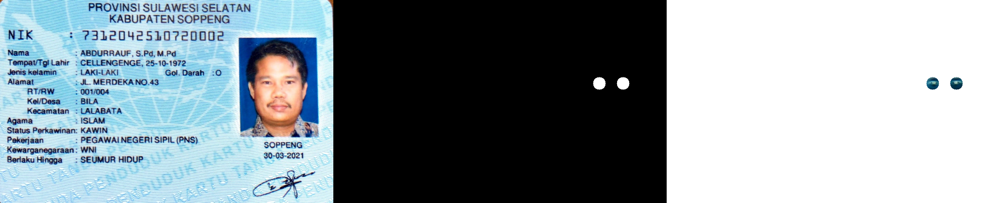

In [74]:
# Membaca gambar asli
original = cv.imread('/content/drive/MyDrive/College/Semester 5/PCVK/Pertemuan 1/KTP.jpeg')

# Membuat gambar mask dengan dua lingkaran berwarna putih (255, 255, 255)
mask = np.zeros(original.shape, dtype=np.uint8)
mask = cv.circle(mask, (695, 200), 15, (255, 255, 255), -1)
mask = cv.circle(mask, (638, 200), 15, (255, 255, 255), -1)

# Melakukan operasi AND bitwise antara gambar asli dan mask
and_result = cv.bitwise_and(original, mask)

# Melakukan operasi AND bitwise antara gambar asli dan mask
nand_result = cv.bitwise_not(and_result)

# Menggabungkan citra asli, mask, dan hasil NAND bitwise dalam satu frame
final_frame = cv.hconcat((original, mask, nand_result))

# Menampilkan hasil
cv2_imshow(final_frame)


XOR (EXCLUSIVE OR)

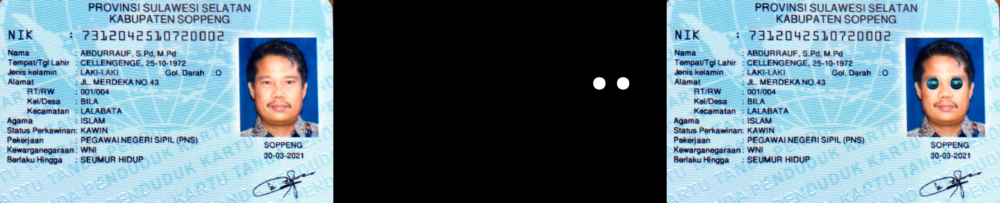

In [75]:
# Membaca gambar asli
original = cv.imread('/content/drive/MyDrive/College/Semester 5/PCVK/Pertemuan 1/KTP.jpeg')

# Membuat gambar mask dengan dua lingkaran berwarna putih (255, 255, 255)
mask = np.zeros(original.shape, dtype=np.uint8)
mask = cv.circle(mask, (695, 200), 15, (255, 255, 255), -1)
mask = cv.circle(mask, (638, 200), 15, (255, 255, 255), -1)

# Melakukan operasi AND bitwise antara gambar asli dan mask
masked = cv.bitwise_xor(original, mask)

# Menggabungkan citra asli, mask, dan hasil XOR bitwise dalam satu frame
final_frame = cv.hconcat((original, mask, masked))

# Menampilkan hasil
cv2_imshow(final_frame)


KESIMPULAN

*   Operator NOT membalik piksel pada citra mask, mengubah piksel putih menjadi hitam dan sebaliknya.
*   Operator OR menggabungkan piksel dari citra asli dan citra mask, menghasilkan citra dengan piksel yang merupakan gabungan dari kedua citra tersebut.
*   Operator AND mengambil hanya piksel yang terdapat dalam kedua citra, menghasilkan citra dengan piksel yang merupakan interseksi dari kedua citra.
*   Operator NAND adalah komplement dari hasil operasi AND.
*   Operator XOR mengambil hanya piksel yang hanya ada di salah satu citra, menghasilkan citra dengan piksel yang merupakan XOR dari kedua citra.





